In [1]:
import scanpy as sc
import muon
from muon import MuData
import pandas as pd
import numpy as np

/Users/dominik.klein/opt/anaconda3/envs/mm_best_muon_full/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
adata_lsi = sc.read("/Users/dominik.klein/data/E14-E15_lsi_peaks_to_adata.h5ad")

In [3]:
def rename_index(x):
    prefix, barcode = x.split("_")
    if prefix == "E14-5":
        new_suffix="0"
    elif prefix == "E15-5":
        new_suffix="1"
    else:
        raise ValueError("no match")
    return barcode+"-"+new_suffix

In [4]:
adata_lsi.obs["old_index"] = adata_lsi.obs.index
adata_lsi.obs["index_adapted"] = adata_lsi.obs["old_index"].apply(rename_index)

In [5]:
adata_gex= sc.read("/Users/dominik.klein/data/E14-E15_adata_filtered_rmDoublets_sctNormalized_WNN.h5ad")

In [6]:
# Load cell cycle genes

## KEGG cell cycle genes
cc_kegg = pd.read_table('/Users/dominik.klein/Downloads/KEGG_mmu_Cell_Cycle.txt').iloc[:,0].tolist()

## Cell cycle genes Regev lab (Tirosh et al. 2016, DOI: 10.1126/science.aad0501)
cc_genes_regev = [x.strip() for x in open('/Users/dominik.klein/Downloads/regev_cell_cycle_genes.txt')]

s_genes_regev = [gene.lower().capitalize() for gene in cc_genes_regev[:43]]
g2m_genes_regev = [gene.lower().capitalize() for gene in cc_genes_regev[43:]]

cc_genes_regev = [gene.lower().capitalize() for gene in cc_genes_regev]

## Cell cycle genes Macosko et al. 2015, https://doi.org/10.1016/j.cell.2015.05.002
cc_genes_macosko = pd.read_table('/Users/dominik.klein/data/Macosko_cell_cycle_genes.txt', delimiter='\t')

s_genes_macosko = [gene.lower().capitalize() for gene in list(cc_genes_macosko['S'].dropna())]
g2m_genes_macosko = [gene.lower().capitalize() for gene in list(cc_genes_macosko['G2.M'].dropna())]
m_genes_macosko = [gene.lower().capitalize() for gene in list(cc_genes_macosko['M'].dropna())]
mg1_genes_macosko = [gene.lower().capitalize() for gene in list(cc_genes_macosko['M.G1'].dropna())]
g1s_genes_macosko = [gene.lower().capitalize() for gene in list(cc_genes_macosko['IG1.S'].dropna())]

cc_genes_macosko = s_genes_macosko + g2m_genes_macosko + m_genes_macosko + mg1_genes_macosko + g1s_genes_macosko

## Combine all
all_cc_genes = list(set(cc_kegg + cc_genes_regev + cc_genes_macosko))

In [7]:
sc.tl.score_genes_cell_cycle(adata_gex, s_genes=s_genes_regev, g2m_genes=g2m_genes_regev)

/Users/dominik.klein/opt/anaconda3/envs/mm_best_muon_full/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


/Users/dominik.klein/opt/anaconda3/envs/mm_best_muon_full/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


In [8]:
adata_gex.obs['proliferation'] = list(adata_gex.obs['phase'].isin(['G2M','S']))
adata_gex.obs['proliferation'][adata_gex.obs['proliferation']==True] = 'Cycling'
adata_gex.obs['proliferation'][adata_gex.obs['proliferation']==False] = 'Non-Cycling'

/var/folders/nv/23yzkl2x1gd0mhpjqgpm0f4hqc8gvy/T/ipykernel_6460/62459955.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_gex.obs['proliferation'][adata_gex.obs['proliferation']==True] = 'Cycling'


In [9]:
adata_gex.X = adata_gex.layers['sct_logcounts'].copy()
del adata_gex.var['highly_variable']

In [10]:
hvgs = pd.Series(adata_gex.var['sct.variable'][adata_gex.var['sct.variable'] > 0].index) # use HVGs from sct
adata_gex.var['highly_variable']= False
adata_gex.var['highly_variable'][hvgs] = True

/var/folders/nv/23yzkl2x1gd0mhpjqgpm0f4hqc8gvy/T/ipykernel_6460/1142173514.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_gex.var['highly_variable'][hvgs] = True
/var/folders/nv/23yzkl2x1gd0mhpjqgpm0f4hqc8gvy/T/ipykernel_6460/1142173514.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_gex.var['highly_variable'][hvgs] = True


In [11]:
# Get HVGs and overlap with cell cycle & ambient genes

## HVGs
hvgs = pd.Series(adata_gex.var_names[adata_gex.var['highly_variable']])
print('\nHighly variable genes before filtering:',adata_gex.var.loc[:,'highly_variable'].value_counts()[1])

# overlap HVGs with CC genes
hvcc = list(hvgs[hvgs.isin(all_cc_genes)])
print('\nHighly variable cell cycle genes:',len(hvcc),'\n',hvcc)

# overlap HVGs with ambient genes
hvambi = list(hvgs[hvgs.isin(list(adata_gex[:,(adata_gex.var['is_ambient-0'] == 'True') | (adata_gex.var['is_ambient-1'] == 'True')].var_names))])
print('\nHighly variable ambient genes:',len(hvambi),'\n',hvambi)

# remove cell cycle genes
adata_gex.var.loc[hvcc,'highly_variable'] = False

# remove ambient genes
adata_gex.var.loc[hvambi,'highly_variable'] = False

print('\nHighly variable genes after filtering:',adata_gex.var.loc[:,'highly_variable'].value_counts()[1])


Highly variable genes before filtering: 1984

Highly variable cell cycle genes: 123 
 ['Mcm3', 'Slc39a10', 'Hjurp', 'Mcm6', 'Nucks1', 'Kdm5b', 'Tgfb2', 'Cenpf', 'Dtl', 'Tubb4b', 'Cers6', 'Osbpl6', 'Ckap5', 'Bub1b', 'Nusap1', 'Bub1', 'Ckap2l', 'Pcna', 'Tpx2', 'Ube2c', 'Aurka', 'Dkc1', 'Pola1', 'Mid1', 'Ect2', 'Ccna2', 'Smc4', 'Trim59', 'Lmna', 'Cks1b', 'Cenpe', 'Ttll7', 'Nfia', 'Nasp', 'Kif2c', 'Cdc20', 'Cdca8', 'Clspn', 'Rere', 'Cdk6', 'Dbf4', 'Tyms', 'Cenpa', 'Pcdh7', 'Dynll1', 'Cit', 'Ran', 'Ubl3', 'Cald1', 'Gadd45a', 'Cdca3', 'Ncapd2', 'Ccnd2', 'Prc1', 'Rrm1', 'Wee1', 'Arl6ip1', 'Plk1', 'Kif22', 'Mki67', 'Cdkn1c', 'Ahi1', 'Cdk1', 'Mdm1', 'Shcbp1', 'Ckap2', 'Neil3', 'Hmgb2', 'Vcl', 'Pbk', 'Esco2', 'Cdca2', 'Rb1', 'Diaph3', 'Bora', 'Mycbp2', 'Dnajc3', 'Anln', 'Cadm1', 'Tle3', 'Kif23', 'Ccnb2', 'Phip', 'Ccdc88a', 'Wwc1', 'Hmmr', 'Larp1', 'Aurkb', 'Brip1', 'Top2a', 'Brca1', 'Birc5', 'Klf6', 'Gmnn', 'Tubb2a', 'Cks2', 'Gadd45g', 'Cdc14b', 'Rhobtb3', 'Hmgcr', 'Ccnb1', 'Rrm2', 'G2e3', 'Mis

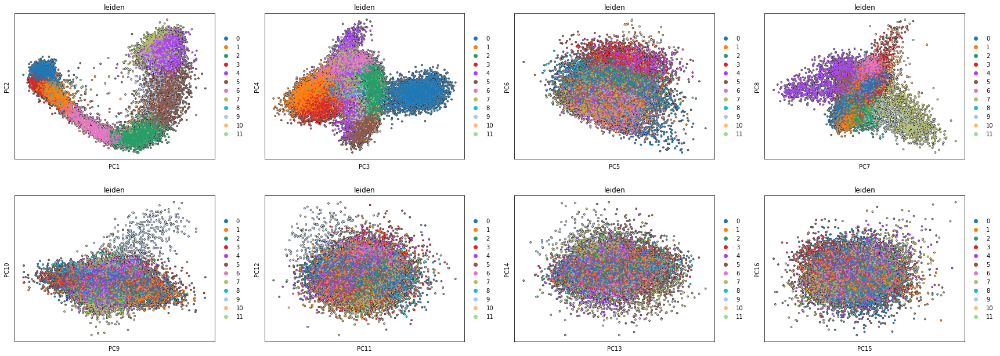

In [12]:
sc.pp.pca(adata_gex, svd_solver='arpack', use_highly_variable=True)
sc.pl.pca(adata_gex, color=['leiden'], components=['1,2', '3,4', '5,6', '7,8', '9,10', '11,12', '13,14', '15,16'], size=20, add_outline=True, alpha=1, outline_width=(0.3, 0.0))

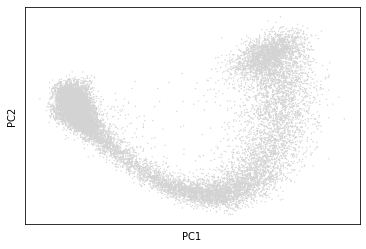

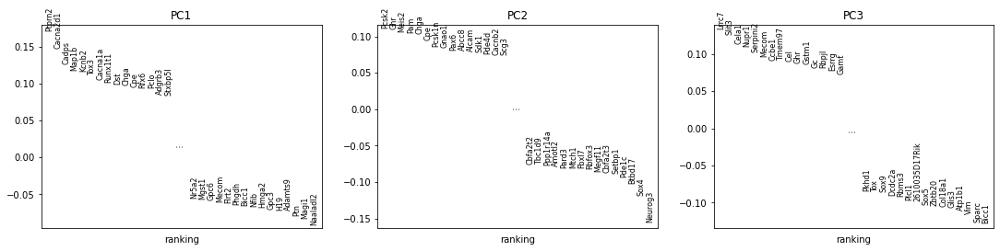

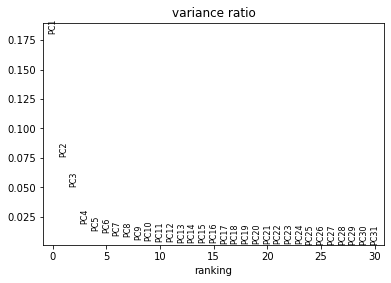

In [13]:
sc.pl.pca_overview(adata_gex)

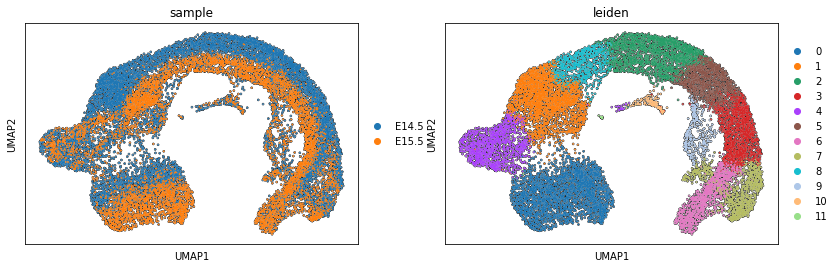

In [14]:
sc.pp.neighbors(adata_gex, metric='correlation', n_pcs=30, n_neighbors=int(np.sqrt(adata_gex.shape[0]) * 0.125)) #, n_pcs=50, n_neighbors=15)
sc.tl.leiden(adata_gex, resolution=0.5)
sc.pl.umap(adata_gex, color=['sample','leiden'], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0), ncols=4)

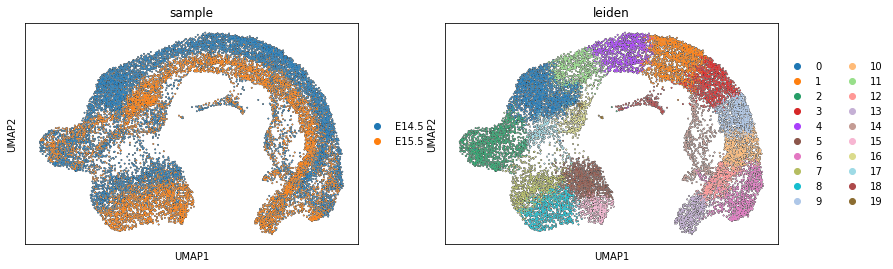

In [15]:
sc.tl.leiden(adata_gex, resolution=1.4)
sc.pl.umap(adata_gex, color=['sample','leiden'], size=5, add_outline=True, alpha=1, outline_width=(0.3, 0.0), ncols=4)

In [16]:
all(adata_lsi.obs["index_adapted"].values == adata_gex.obs.index.values)

True

In [17]:
adata_lsi.obs.set_index("index_adapted", inplace=True)

In [29]:
sc.pp.neighbors(adata_lsi, use_rep="lsi_red2", metric='correlation', n_neighbors=int(np.sqrt(adata_lsi.shape[0]) * 0.125))

In [30]:
sc.tl.umap(adata_lsi)

In [24]:
adata_lsi.obs = adata_gex.obs

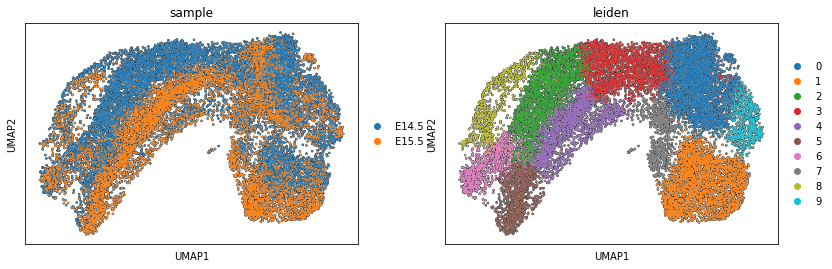

In [31]:
sc.tl.leiden(adata_lsi, resolution=0.5)
sc.pl.umap(adata_lsi, color=['sample','leiden'], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0), ncols=4)

In [32]:
mdata = MuData({"GEX": adata_gex, "ATAC": adata_lsi})

In [33]:
mdata

MuData object with n_obs × n_vars = 16978 × 242922
  2 modalities
    GEX:	16978 x 14663
      obs:	'n_counts', 'sample', 'int_id', 'reporter', 'log_cell_probs', 'cell_barcodes_du', 'cell_barcodes_cr', 'cell_barcodes', 'log_counts', 'n_genes', 'log_genes', 'mt_frac', 'rp_frac', 'ambi_frac', 'total_counts_rank', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'leiden', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ATAC', 'nFeature_ATAC', 'nucleosome_signal', 'nucleosome_percentile', 'TSS.enrichment', 'TSS.percentile', 'log_nCount_ATAC', 'log_nFeature_ATAC', 'scrublet_scores', 'scrublet_doublets', 'scrublet_doublets_cat', 'dd_doublets', 'dd_scores', 'dd_log_p_values', 'dd_voting_average', 'dd_-log_p_values', 'dd_doublets_cat', 'pANN', 'DF_classifications_1', 'DF_classifications_2', 'pANN_SCT', 'DF_SCT_classifications_1', 'DF_SCT_classifications_2', 'df_doublets', 'scDblFinder.class', 'scDblFinder.score', 'hybrid_class', 'hybrid_score', 'scDblFinder.class.sct', 'scDblFinder.score.sct', 'hybrid_class_sct', 'hybrid_score_sct', 'sdf_doublets', 'scds_doublets', 'doublet_calls', 'final_doublets', 'final_doublets_cat', 'batch', 'size_factors', 'mt_frac_raw', 'rp_frac_raw', 'n_genes_raw', 'log_genes_raw', 'n_counts_raw', 'log_counts_raw', 'S_score', 'G2M_score', 'phase', 'proliferation'
      var:	'feature_types', 'genome', 'gene_ids-0', 'n_cells-0', 'ambient_genes-0', 'is_ambient-0', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'gene_ids-1', 'n_cells-1', 'ambient_genes-1', 'is_ambient-1', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'n_cells', 'sct.detection_rate', 'sct.gmean', 'sct.variance', 'sct.residual_variance', 'sct.variable', 'highly_variable'
      uns:	'final_doublets_cat_colors', 'leiden', 'neighbors', 'neighbors_wnn', 'pca', 'reporter_colors', 'sample_colors', 'umap', 'leiden_colors'
      obsm:	'X_pca', 'X_pca_wsnn', 'X_spca_wsnn', 'X_umap', 'X_umap_wsnn'
      varm:	'PCs', 'PCs_wsnn', 'SPCA_wsnn'
      layers:	'log_raw_counts', 'raw_counts', 'scran_counts', 'sct_counts', 'sct_logcounts', 'sct_scale_data'
      obsp:	'connectivities', 'distances'
    ATAC:	16978 x 228259
      obs:	'n_counts', 'sample', 'int_id', 'reporter', 'log_cell_probs', 'cell_barcodes_du', 'cell_barcodes_cr', 'cell_barcodes', 'log_counts', 'n_genes', 'log_genes', 'mt_frac', 'rp_frac', 'ambi_frac', 'total_counts_rank', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'leiden', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ATAC', 'nFeature_ATAC', 'nucleosome_signal', 'nucleosome_percentile', 'TSS.enrichment', 'TSS.percentile', 'log_nCount_ATAC', 'log_nFeature_ATAC', 'scrublet_scores', 'scrublet_doublets', 'scrublet_doublets_cat', 'dd_doublets', 'dd_scores', 'dd_log_p_values', 'dd_voting_average', 'dd_-log_p_values', 'dd_doublets_cat', 'pANN', 'DF_classifications_1', 'DF_classifications_2', 'pANN_SCT', 'DF_SCT_classifications_1', 'DF_SCT_classifications_2', 'df_doublets', 'scDblFinder.class', 'scDblFinder.score', 'hybrid_class', 'hybrid_score', 'scDblFinder.class.sct', 'scDblFinder.score.sct', 'hybrid_class_sct', 'hybrid_score_sct', 'sdf_doublets', 'scds_doublets', 'doublet_calls', 'final_doublets', 'final_doublets_cat', 'batch', 'size_factors', 'mt_frac_raw', 'rp_frac_raw', 'n_genes_raw', 'log_genes_raw', 'n_counts_raw', 'log_counts_raw', 'S_score', 'G2M_score', 'phase', 'proliferation'
      uns:	'neighbors', 'umap', 'leiden', 'sample_colors', 'leiden_colors'
      obsm:	'lsi_full', 'lsi_red', 'lsi_red2', 'X_umap'
      obsp:	'distances', 'connectivities

In [34]:
muon.pp.neighbors(mdata, metric='correlation',  n_neighbors=int(np.sqrt(mdata.shape[0]) * 0.125))

/Users/dominik.klein/opt/anaconda3/envs/mm_best_muon_full/lib/python3.9/site-packages/pynndescent/pynndescent_.py:339: NumbaWarning: Cannot cache compiled function "init_rp_tree" as it uses dynamic globals (such as ctypes pointers and large global arrays)
  init_rp_tree(data, dist, current_graph, leaf_array)
/Users/dominik.klein/opt/anaconda3/envs/mm_best_muon_full/lib/python3.9/site-packages/pynndescent/pynndescent_.py:341: NumbaWarning: Cannot cache compiled function "init_random" as it uses dynamic globals (such as ctypes pointers and large global arrays)
  init_random(n_neighbors, data, current_graph, dist, rng_state)
/Users/dominik.klein/opt/anaconda3/envs/mm_best_muon_full/lib/python3.9/site-packages/pynndescent/pynndescent_.py:351: NumbaWarning: Cannot cache compiled function "process_candidates" as it uses dynamic globals (such as ctypes pointers and large global arrays)
  nn_descent_internal_low_memory_parallel(
/Users/dominik.klein/opt/anaconda3/envs/mm_best_muon_full/lib/pyt

In [35]:
muon.tl.leiden(mdata, resolution=0.5)

In [36]:
muon.tl.umap(mdata)

In [42]:
mdata.obs["sample"] = mdata["ATAC"].obs["sample"]
mdata["ATAC"].obs["leiden_combined"] = mdata.obs["leiden"]
mdata["GEX"].obs["leiden_combined"] = mdata.obs["leiden"]

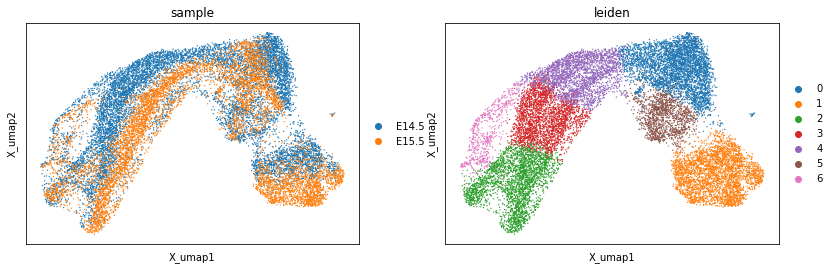

In [38]:
muon.pl.umap(mdata, color=["sample", "leiden"])

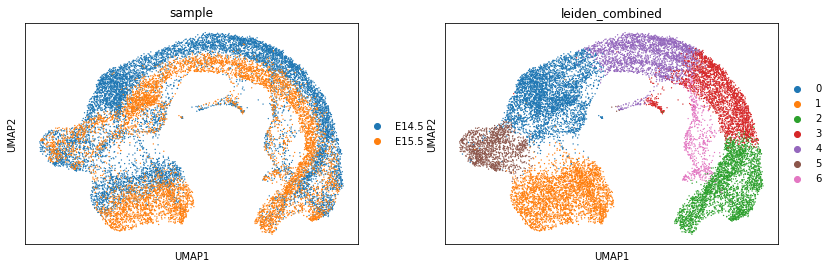

In [43]:
muon.pl.umap(mdata["GEX"], color=["sample", "leiden_combined"])

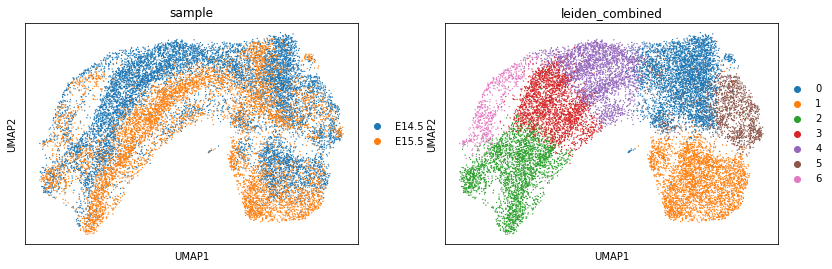

In [44]:
muon.pl.umap(mdata["ATAC"], color=["sample", "leiden_combined"])

In [45]:
mdata.obs = mdata["GEX"].obs.join(mdata["ATAC"].obs, rsuffix="atac")

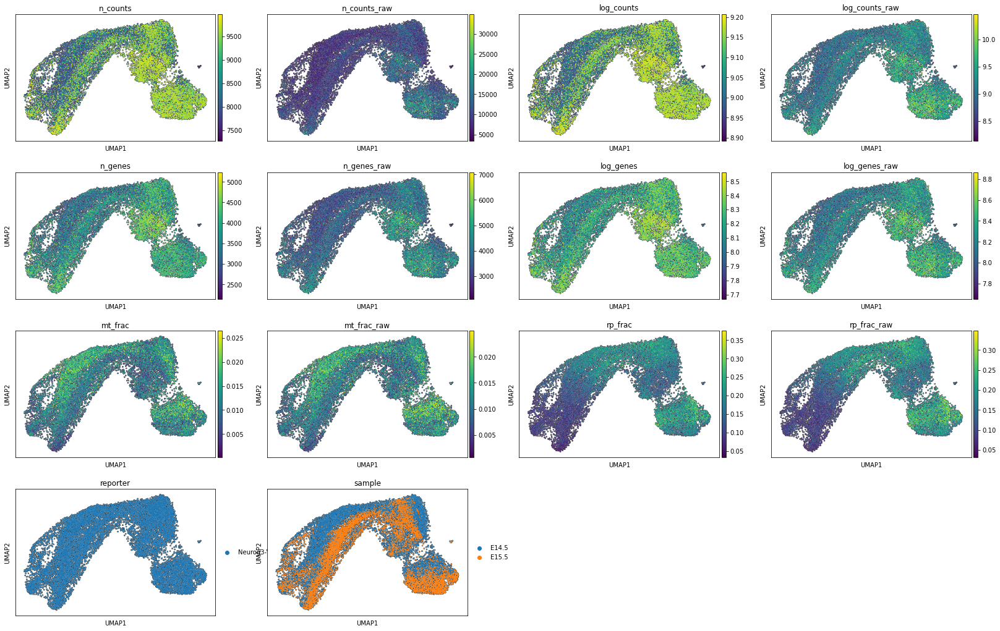

In [46]:
sc.pl.umap(mdata, color=['n_counts', 'n_counts_raw', 'log_counts', 'log_counts_raw','n_genes','n_genes_raw','log_genes','log_genes_raw','mt_frac','mt_frac_raw','rp_frac','rp_frac_raw', 'reporter', "sample"], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0), ncols=4)


In [47]:
mdata["ATAC"].obs = mdata.obs

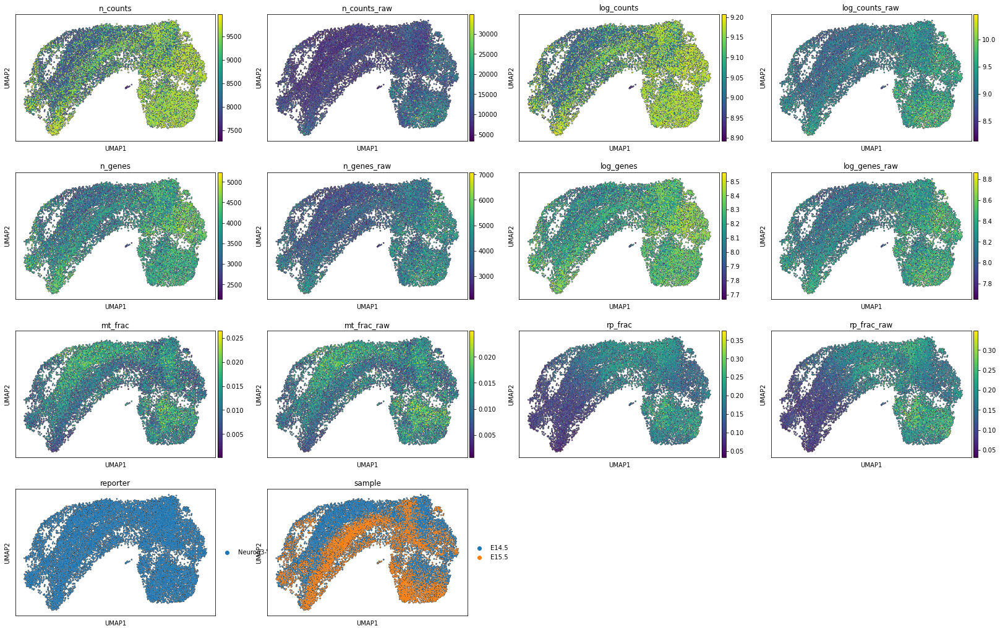

In [48]:
sc.pl.umap(mdata["ATAC"], color=['n_counts', 'n_counts_raw', 'log_counts', 'log_counts_raw','n_genes','n_genes_raw','log_genes','log_genes_raw','mt_frac','mt_frac_raw','rp_frac','rp_frac_raw', 'reporter', "sample"], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0), ncols=4)


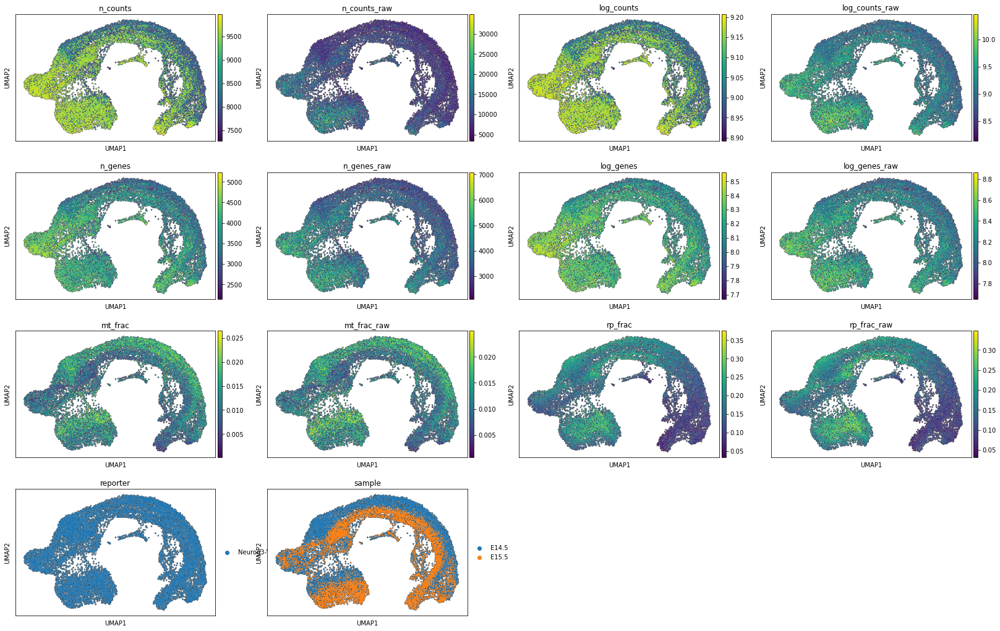

In [49]:
sc.pl.umap(mdata["GEX"], color=['n_counts', 'n_counts_raw', 'log_counts', 'log_counts_raw','n_genes','n_genes_raw','log_genes','log_genes_raw','mt_frac','mt_frac_raw','rp_frac','rp_frac_raw', 'reporter', "sample"], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0), ncols=4)


### ATAC metrics

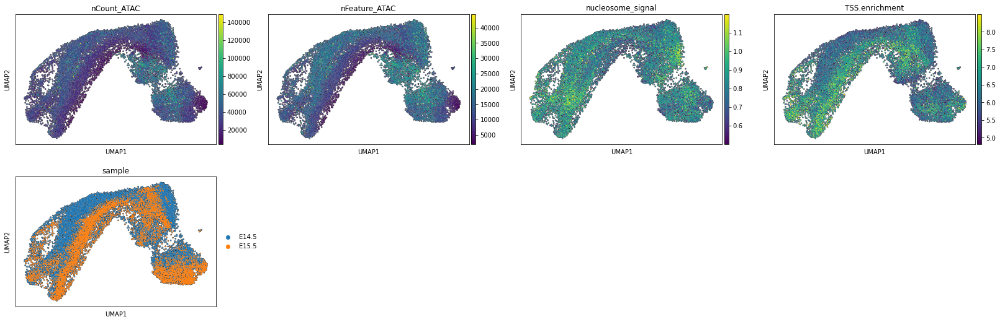

In [50]:
sc.pl.umap(mdata, color=["nCount_ATAC", "nFeature_ATAC", "nucleosome_signal", "TSS.enrichment", "sample"], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0), ncols=4)


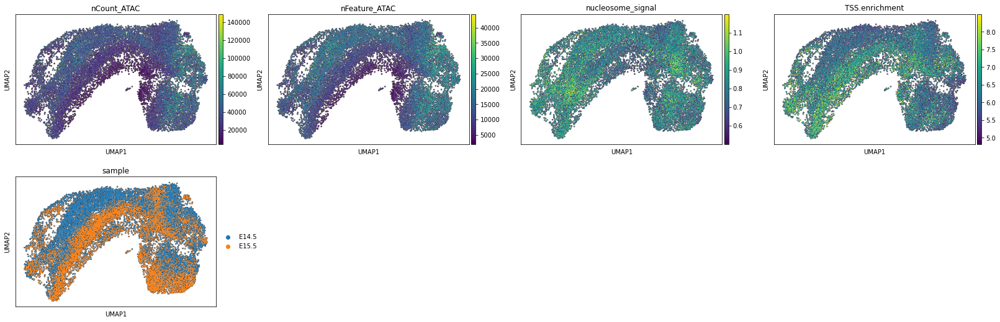

In [51]:
sc.pl.umap(mdata["ATAC"], color=["nCount_ATAC", "nFeature_ATAC", "nucleosome_signal", "TSS.enrichment", "sample"], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0), ncols=4)

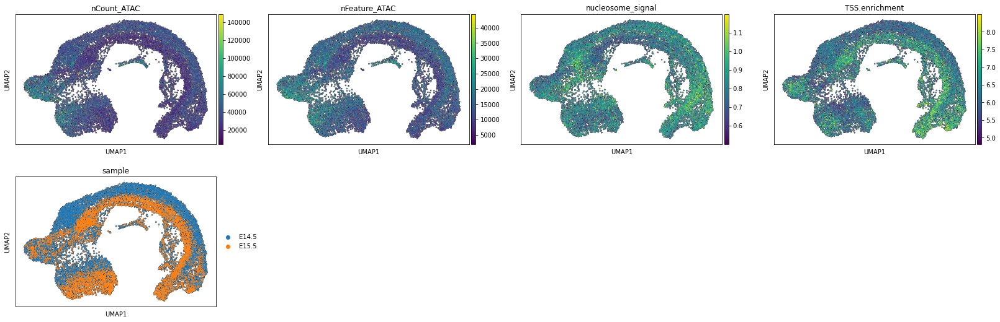

In [52]:
sc.pl.umap(mdata["GEX"], color=["nCount_ATAC", "nFeature_ATAC", "nucleosome_signal", "TSS.enrichment", "sample"], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0), ncols=4)

### Clustering on differently constructed graphs

In [53]:
muon.tl.leiden(mdata, key_added="leiden_wnn_graph", resolution=1.5)

In [54]:
muon.tl.leiden(mdata["GEX"], key_added="leiden_gex_graph", resolution=1)

In [55]:
muon.tl.leiden(mdata["ATAC"], key_added="leiden_ATAC_graph", resolution=1)

In [56]:
mdata.obs["leiden_gex_graph"] = mdata["GEX"].obs["leiden_gex_graph"]
mdata.obs["leiden_ATAC_graph"] = mdata["ATAC"].obs["leiden_ATAC_graph"]

mdata["GEX"].obs["leiden_ATAC_graph"] = mdata["ATAC"].obs["leiden_ATAC_graph"]
mdata["GEX"].obs["leiden_wnn_graph"] = mdata.obs["leiden_wnn_graph"]

mdata["ATAC"].obs["leiden_gex_graph"] = mdata["GEX"].obs["leiden_gex_graph"]
mdata["ATAC"].obs["leiden_wnn_graph"] = mdata.obs["leiden_wnn_graph"]

Clusters obtained from (WNN / GEX / ATAC) graph on WNN-based UMAP


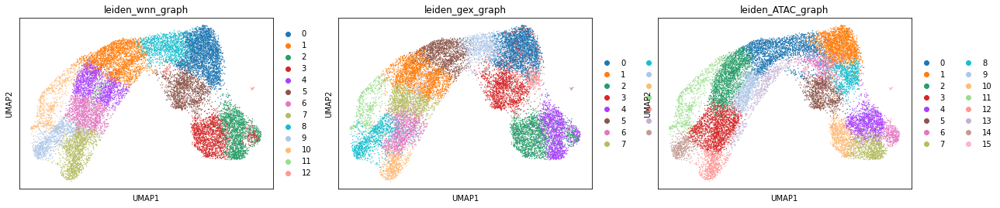

In [57]:
print("Clusters obtained from (WNN / GEX / ATAC) graph on WNN-based UMAP")
sc.pl.umap(mdata, color=["leiden_wnn_graph", "leiden_gex_graph", "leiden_ATAC_graph"])

Clusters obtained from (WNN / GEX / ATAC) graph on GEX-based UMAP


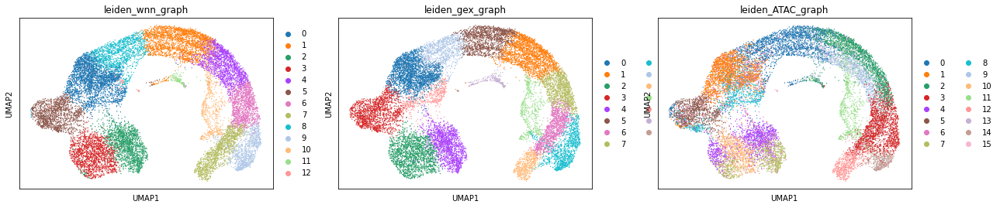

In [58]:
print("Clusters obtained from (WNN / GEX / ATAC) graph on GEX-based UMAP")
sc.pl.umap(mdata["GEX"], color=["leiden_wnn_graph", "leiden_gex_graph", "leiden_ATAC_graph"])

Clusters obtained from (WNN / GEX / ATAC) graph on ATAC-based UMAP


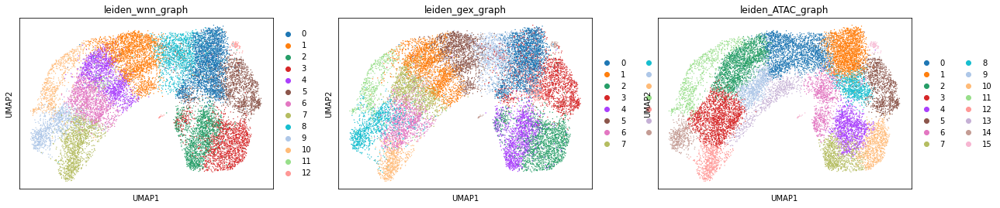

In [59]:
print("Clusters obtained from (WNN / GEX / ATAC) graph on ATAC-based UMAP")
sc.pl.umap(mdata["ATAC"], color=["leiden_wnn_graph", "leiden_gex_graph", "leiden_ATAC_graph"])

## Try different resolutions on WNN graph

In [60]:
muon.tl.leiden(mdata, resolution=1.4, key_added='leiden_r1.4')
muon.tl.leiden(mdata, resolution=1.5, key_added='leiden_r1.5')
muon.tl.leiden(mdata, resolution=1.6, key_added='leiden_r1.6')
muon.tl.leiden(mdata, resolution=1.7, key_added='leiden_r1.7')
muon.tl.leiden(mdata, resolution=1.8, key_added='leiden_r1.8')
muon.tl.leiden(mdata, resolution=1.9, key_added='leiden_r1.9')
muon.tl.leiden(mdata, resolution=2.0, key_added='leiden_r2.0')
muon.tl.leiden(mdata, resolution=2.1, key_added='leiden_r2.1')
muon.tl.leiden(mdata, resolution=2.2, key_added='leiden_r2.2')
muon.tl.leiden(mdata, resolution=2.3, key_added='leiden_r2.3')
muon.tl.leiden(mdata, resolution=2.4, key_added='leiden_r2.4')
muon.tl.leiden(mdata, resolution=2.5, key_added='leiden_r2.5')

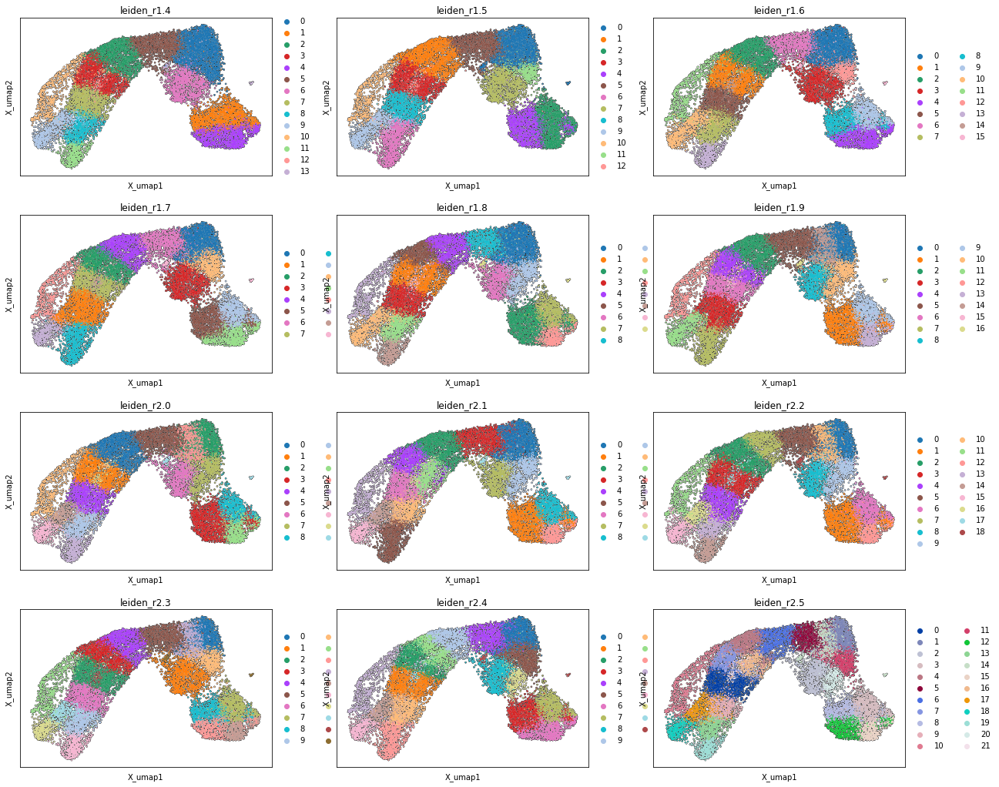

In [61]:
muon.pl.umap(mdata, color=['leiden_r1.4','leiden_r1.5','leiden_r1.6','leiden_r1.7','leiden_r1.8','leiden_r1.9', 'leiden_r2.0', 'leiden_r2.1', 'leiden_r2.2', 'leiden_r2.3', 'leiden_r2.4', 'leiden_r2.5'], size=10, add_outline=True, alpha=1, outline_width=(0.3, 0.0), ncols=3)


In [63]:
mdata["GEX"].obsm["umap_GEX"] = mdata["GEX"].obsm["X_umap"]
mdata["GEX"].obsm["umap_ATAC"] = mdata["ATAC"].obsm["X_umap"]

In [64]:
mdata["GEX"].uns['neighbors_wnn'] = mdata.uns['neighbors'].copy()

In [65]:
mdata["GEX"].obsp["distances"] = mdata.obsp["distances"]
mdata["GEX"].obsp["connectivities"] = mdata.obsp["connectivities"]

In [66]:
mdata["GEX"].obsm['umap'] = mdata.obsm['X_umap'].copy()

In [67]:
mdata["GEX"].obs["umap_GEX_1"] = mdata["GEX"].obsm["X_umap"][:,0]
mdata["GEX"].obs["umap_GEX_2"] = mdata["GEX"].obsm["X_umap"][:,1]
mdata["GEX"].obs["umap_ATAC_1"] = mdata["ATAC"].obsm["X_umap"][:,0]
mdata["GEX"].obs["umap_ATAC_2"] = mdata["ATAC"].obsm["X_umap"][:,1]

In [68]:
mdata["GEX"].obs["leiden"] = mdata.obs["leiden_r2.3"]

In [69]:
mdata["GEX"].write("/Users/dominik.klein/data/E14-E15_adata_filtered_rmDoublets_wnn_graph.h5ad")